In [132]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [136]:
df=pd.read_csv("processed/results_khaled.csv",error_bad_lines=False)

b'Skipping line 5371: expected 8 fields, saw 18\nSkipping line 6563: expected 8 fields, saw 15\nSkipping line 6565: expected 8 fields, saw 9\nSkipping line 7159: expected 8 fields, saw 17\nSkipping line 7751: expected 8 fields, saw 12\nSkipping line 7752: expected 8 fields, saw 13\nSkipping line 8344: expected 8 fields, saw 17\nSkipping line 8938: expected 8 fields, saw 17\nSkipping line 9532: expected 8 fields, saw 11\nSkipping line 9533: expected 8 fields, saw 14\nSkipping line 10127: expected 8 fields, saw 10\nSkipping line 10128: expected 8 fields, saw 14\nSkipping line 10720: expected 8 fields, saw 11\nSkipping line 10721: expected 8 fields, saw 14\nSkipping line 11313: expected 8 fields, saw 15\nSkipping line 11315: expected 8 fields, saw 11\nSkipping line 11905: expected 8 fields, saw 15\nSkipping line 12489: expected 8 fields, saw 14\nSkipping line 12492: expected 8 fields, saw 11\nSkipping line 13077: expected 8 fields, saw 15\nSkipping line 13080: expected 8 fields, saw 10\nS

b'Skipping line 448276: expected 8 fields, saw 13\nSkipping line 448828: expected 8 fields, saw 10\nSkipping line 449968: expected 8 fields, saw 12\nSkipping line 450525: expected 8 fields, saw 12\nSkipping line 450534: expected 8 fields, saw 13\nSkipping line 451088: expected 8 fields, saw 12\nSkipping line 451098: expected 8 fields, saw 12\nSkipping line 452803: expected 8 fields, saw 15\nSkipping line 453353: expected 8 fields, saw 13\nSkipping line 455613: expected 8 fields, saw 13\nSkipping line 456165: expected 8 fields, saw 14\n'
b'Skipping line 460138: expected 8 fields, saw 13\nSkipping line 460697: expected 8 fields, saw 12\nSkipping line 461835: expected 8 fields, saw 11\nSkipping line 462387: expected 8 fields, saw 13\nSkipping line 463513: expected 8 fields, saw 12\nSkipping line 464654: expected 8 fields, saw 11\nSkipping line 465211: expected 8 fields, saw 9\nSkipping line 465790: expected 8 fields, saw 10\nSkipping line 466347: expected 8 fields, saw 12\nSkipping line 4

In [137]:
df['y']=df['y'].apply(lambda x: abs(1080-x))
df['global_id']=df_section["object_id"].astype(str) +"_"+ df_section["object_class"]

In [138]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 945385 entries, 0 to 945384
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   frame         945385 non-null  int64  
 1   object_id     945385 non-null  int64  
 2   object_class  945385 non-null  object 
 3   x             945385 non-null  float64
 4   y             945385 non-null  float64
 5   w             945385 non-null  float64
 6   h             945385 non-null  float64
 7   score         945385 non-null  float64
 8   global_id     42437 non-null   object 
dtypes: float64(5), int64(2), object(2)
memory usage: 64.9+ MB


In [139]:
to_drop=df_section['object_id'].value_counts()
to_drop=list(to_drop[to_drop<50].keys())
df=df.query(f'object_id not in {to_drop}')
# df_section.drop(df_section[df_section[df_section['object_id']].shape[0] < 50])

<AxesSubplot:>

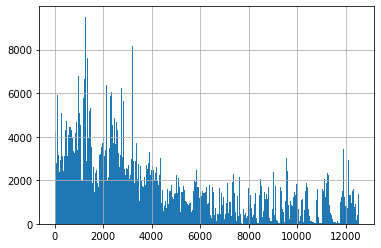

In [144]:
df['object_id'].hist(bins=500)

In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 939505 entries, 0 to 945384
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   frame         939505 non-null  int64  
 1   object_id     939505 non-null  int64  
 2   object_class  939505 non-null  object 
 3   x             939505 non-null  float64
 4   y             939505 non-null  float64
 5   w             939505 non-null  float64
 6   h             939505 non-null  float64
 7   score         939505 non-null  float64
 8   global_id     41086 non-null   object 
dtypes: float64(5), int64(2), object(2)
memory usage: 71.7+ MB


In [145]:
df2=df.sort_values('object_id').drop_duplicates(subset=['x', 'y'], keep='last')

In [146]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 939438 entries, 0 to 945225
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   frame         939438 non-null  int64  
 1   object_id     939438 non-null  int64  
 2   object_class  939438 non-null  object 
 3   x             939438 non-null  float64
 4   y             939438 non-null  float64
 5   w             939438 non-null  float64
 6   h             939438 non-null  float64
 7   score         939438 non-null  float64
 8   global_id     41084 non-null   object 
dtypes: float64(5), int64(2), object(2)
memory usage: 71.7+ MB


In [48]:
df_stats=df.describe()
df.describe()

,frame,object_id,x,y,w,h,score
count,9.453850e+05,945385.000000,945385.000000,945385.000000,945385.000000,945385.000000,945385.000000
mean,3.034494e+05,4187.599188,810.355661,775.310828,191.912714,144.312945,0.731466
std,1.624982e+08,3470.661573,385.170080,151.663747,199.403767,118.294454,0.182171
min,0.000000e+00,1.000000,1.686705,65.781384,24.699926,38.734570,0.400003
25%,3.102500e+04,1386.000000,552.865641,707.857551,93.949376,82.066980,0.568402
50%,7.112000e+04,3053.000000,791.672624,815.673705,121.168729,101.539153,0.750895
75%,1.269760e+05,6152.000000,971.388938,896.103521,213.718406,160.111890,0.902119
max,1.558532e+11,12552.000000,1887.611349,1079.237551,1650.484939,892.219226,0.991591


In [49]:
df["object_class"].value_counts()

car         614735
bicycle     124946
tricycle    117495
person       58573
cyclist      29636
Name: object_class, dtype: int64

In [50]:
df_stats["frame"]["max"]
# df_stats["frame"]["min"]
# df[df[0]>600]

155853155858.0

In [55]:
start=0
end=600
df_section=df.query(f"frame>= {start} and frame<={end}")
df_section

,frame,object_id,object_class,x,y,w,h,score,global_id
0,0,1,car,1120.806641,768.615814,244.586182,140.965027,0.965347,1_car
1,0,2,car,1706.433838,792.577118,206.184326,117.008362,0.515182,2_car
2,0,1,bicycle,803.864624,928.337570,106.506836,97.623489,0.684870,1_bicycle
3,0,1,person,1170.393188,511.914429,94.661377,180.795837,0.768190,1_person
4,0,2,person,426.403595,405.012329,119.328583,218.456421,0.538235,2_person
...,...,...,...,...,...,...,...,...,...
4645,599,41,bicycle,1381.636676,975.170631,130.306341,128.213870,0.487225,41_bicycle
4646,599,12,person,461.604577,471.272715,108.076454,211.780785,0.827758,12_person
4647,600,9,car,428.483198,614.704057,422.073965,355.656833,0.960556,9_car
4648,600,28,car,984.777615,792.161998,178.633487,95.222067,0.672127,28_car


In [52]:
df_section["object_class"].value_counts()

car         61715
bicycle     10428
cyclist      3323
person       3221
tricycle     2252
Name: object_class, dtype: int64

In [44]:
grouped_section=df_section.groupby(['object_id', 'object_class'], as_index = False).agg({'x': list,'y': list})

In [31]:
grouped_section["len"]=grouped_section["x"].apply(lambda x:len(x))

In [32]:
from math import log
counts=grouped_section["object_class"].value_counts()
alphas=counts.apply(lambda x:2/log(x)).to_dict()
colors = {'car':'tab:blue', 'bicycle':'tab:orange', 'person':'tab:green',  'cyclist':'tab:red', 'tricycle':'tab:purple'}
alphas

{'car': 0.3206994022839291,
 'bicycle': 0.3419198070273967,
 'tricycle': 0.4207346278486228,
 'cyclist': 0.4391862247503719,
 'person': 0.47075491110477363}

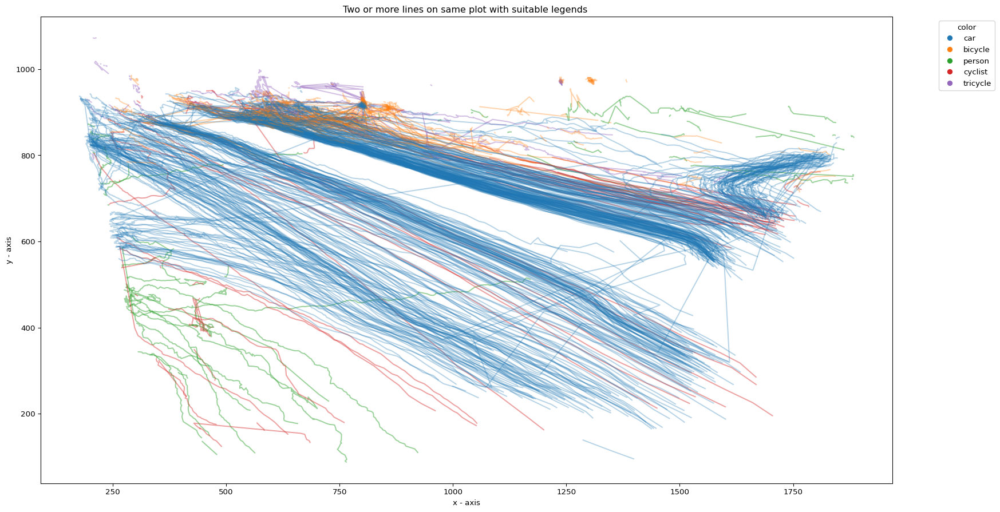

In [236]:
my_dpi=96
plt.figure(figsize=(1920/my_dpi, 1080/my_dpi), dpi=my_dpi)

for index, row in grouped_section.iterrows():
    plt.plot(row["x"], row["y"],alpha=alphas.get(row['object_class'],0.2),c=colors.get(row['object_class'],'tab:brown'))

plt.xlabel('x - axis')
plt.ylabel('y - axis')
plt.title('Two or more lines on same plot with suitable legends ')

# add a legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
plt.legend(title='color', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [156]:
type(row)

pandas.core.series.Series

In [ ]:

# plotting the line 1 points 

# line 2 points
x2 = [10,20,30]
y2 = [40,10,30]
# plotting the line 2 points 
plt.plot(x2, y2, label = "line 2")
plt.xlabel('x - axis')
# Set the y axis label of the current axis.
plt.ylabel('y - axis')
# Set a title of the current axes.
plt.title('Two or more lines on same plot with suitable legends ')
# show a legend on the plot
plt.legend()
# Display a figure.

In [58]:
# df_section.apply(lambda x:f"{x['object_class']}_{x['object_id']}")
# df_section = df_section[['object_id', 'object_class']].agg('-'.join, axis=1)
start=0
end=6000
df_section=df.query(f"frame>= {start} and frame<={end}")

df_section["object_id"].nunique()

325

In [99]:
color_discrete_map = {'car':'rgba(255, 0, 0, 0.3)',
 'bicycle':'rgba(255, 0, 255, 0.5)',
 'person':'rgba(255, 255, 0, 0.2)',
 'cyclist':'rgba(0, 0, 255, 0.7)',
 'tricycle':'rgba(0, 0, 0, 0.5)'}


In [101]:
  color_discrete_map = {
        "car": f"rgba(40,108,183,{alphas['car']})",
        "bicycle": f"rgba(255,120,  0, {alphas['bicycle']})",
        "person": f"rgba(226,  0, 25, {alphas['person']})",
        "cyclist": f"rgba(226,  0, 25, {alphas['cyclist']})",
        "tricycle": f"rgba(162, 67,192, {alphas['tricycle']})",
    }

In [110]:
import plotly.express as px

# df = px.data.gapminder().query("country=='Canada'")
fig = px.line(df_section, x="x", y="y", line_group="global_id",
              render_mode='webgl', color="object_class",
              color_discrete_map=color_discrete_map
             )
fig.update_layout(template="plotly_white")



fig.show()

# Dash plotly clean trials

In [111]:
start=0
end=6000
df_section=df.query(f"frame>= {start} and frame<={end}")
df_section

,frame,object_id,object_class,x,y,w,h,score,global_id
0,0,1,car,1120.806641,768.615814,244.586182,140.965027,0.965347,1_car
1,0,2,car,1706.433838,792.577118,206.184326,117.008362,0.515182,2_car
2,0,1,bicycle,803.864624,928.337570,106.506836,97.623489,0.684870,1_bicycle
3,0,1,person,1170.393188,511.914429,94.661377,180.795837,0.768190,1_person
4,0,2,person,426.403595,405.012329,119.328583,218.456421,0.538235,2_person
...,...,...,...,...,...,...,...,...,...
42442,5999,391,car,1539.136358,623.852655,307.798130,205.028336,0.942301,391_car
42443,6000,385,car,223.739863,725.232643,131.033765,117.372490,0.872910,385_car
42444,6000,388,car,805.885487,913.397454,99.223834,79.412276,0.684429,388_car
42445,6000,386,car,452.354450,838.740594,113.529215,88.945955,0.903993,386_car


In [147]:
df["object_class"].value_counts()

car         614107
bicycle     124154
tricycle    117057
person       56327
cyclist      27860
Name: object_class, dtype: int64

In [126]:
to_drop=df_section['object_id'].value_counts()
to_drop=list(to_drop[to_drop<50].keys())
df=df.query(f'object_id not in {to_drop}')
# df_section.drop(df_section[df_section[df_section['object_id']].shape[0] < 50])

In [69]:
grouped_section=df_section.groupby(['object_id', 'object_class'], as_index = False).agg({'x': list,'y': list})

In [ ]:
from math import log
counts=grouped_section["object_class"].value_counts()
alphas=counts.apply(lambda x:2/log(x)).to_dict()
    colors = {'car':'tab:blue', 'bicycle':'tab:orange', 'person':'tab:green',  'cyclist':'tab:red', 'tricycle':'tab:purple'}
alphas

In [ ]:
my_dpi=96
plt.figure(figsize=(1920/my_dpi, 1080/my_dpi), dpi=my_dpi)

for index, row in grouped_section.iterrows():
    plt.plot(row["x"], row["y"],alpha=alphas.get(row['object_class'],0.2),c=colors.get(row['object_class'],'tab:brown'))

plt.xlabel('x - axis')
plt.ylabel('y - axis')
plt.title('Two or more lines on same plot with suitable legends ')

# add a legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
plt.legend(title='color', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [88]:
colors = {'car':'#FECB52',
 'bicycle':'#636EFA',
 'person':'#EF553B',
 'cyclist':'#FF6692',
 'tricycle':'#B6E880'}


In [94]:
import plotly.graph_objects as go


fig = go.Figure()

for index, row in grouped_section.iterrows():

    fig.add_trace(go.Scatter(x=row["x"], y=row["y"],
                             mode='lines',
                             line=dict(color=colors.get(
                                 row['object_class'], 0)),
                             opacity=alphas.get(row['object_class'], 0.2),
                             name=row['object_class'])
                  )


fig.show()

In [87]:
dict(color=colors.get(row['object_class'],0))

{'color': '636EFA'}

In [95]:
import seaborn as sns

In [97]:
prnit(sns.color_palette("tab10"))


[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765), (1.0, 0.4980392156862745, 0.054901960784313725), (0.17254901960784313, 0.6274509803921569, 0.17254901960784313), (0.8392156862745098, 0.15294117647058825, 0.1568627450980392), (0.5803921568627451, 0.403921568627451, 0.7411764705882353), (0.5490196078431373, 0.33725490196078434, 0.29411764705882354), (0.8901960784313725, 0.4666666666666667, 0.7607843137254902), (0.4980392156862745, 0.4980392156862745, 0.4980392156862745), (0.7372549019607844, 0.7411764705882353, 0.13333333333333333), (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]
